In [9]:
import torch
import torchvision
import torch.nn.functional as F

def conv3x3_bn(ci, co):
    return torch.nn.Sequential(
        torch.nn.Conv2d(ci, co, 3, padding=1),
        torch.nn.BatchNorm2d(co),
        torch.nn.ReLU(inplace=True)
    )

class deconv(torch.nn.Module):
    def __init__(self, ci, co):
        super(deconv, self).__init__()
        self.upsample = torch.nn.ConvTranspose2d(ci, co, 2, stride=2)
        self.conv1 = conv3x3_bn(ci, co)
        self.conv2 = conv3x3_bn(co, co)
    
    # recibe la salida de la capa anetrior y la salida de la etapa
    # correspondiente del encoder
    def forward(self, x1, x2):
        x1 = self.upsample(x1)
        diffX = x2.size()[2] - x1.size()[2]
        diffY = x2.size()[3] - x1.size()[3]
        x1 = F.pad(x1, (diffX, 0, diffY, 0))
        # concatenamos los tensores
        x = torch.cat([x2, x1], dim=1)
        x = self.conv1(x)
        x = self.conv2(x)
        return x

class out_conv(torch.nn.Module):
    def __init__(self, ci, co, coo):
        super(out_conv, self).__init__()
        self.upsample = torch.nn.ConvTranspose2d(ci, co, 2, stride=2)
        self.conv = conv3x3_bn(ci, co)
        self.final = torch.nn.Conv2d(co, coo, 1)

    def forward(self, x1, x2):
        x1 = self.upsample(x1)
        diffX = x2.size()[2] - x1.size()[2]
        diffY = x2.size()[3] - x1.size()[3]
        x1 = F.pad(x1, (diffX, 0, diffY, 0))
        x = self.conv(x1)
        x = self.final(x)
        return x

class UNetResnet(torch.nn.Module):
    def __init__(self, n_classes=10, in_ch=3):
        super().__init__()

        self.encoder = torchvision.models.resnet18(pretrained=True) # Para entrenamiento
        #self.encoder = torchvision.models.resnet18(pretrained=False) # Para predicción únicamente
        if in_ch != 3:
          self.encoder.conv1 = torch.nn.Conv2d(in_ch, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        self.deconv1 = deconv(512,256)
        self.deconv2 = deconv(256,128)
        self.deconv3 = deconv(128,64)
        self.out = out_conv(64, 64, n_classes)

    def forward(self, x):
        #x_in = torch.tensor(x.clone())
        x_in = x.clone().detach() #or the same with .requires_grad_(True),
        x = self.encoder.relu(self.encoder.bn1(self.encoder.conv1(x)))
        #x = self.encoder.maxpool(x)
        x1 = self.encoder.layer1(x)
        x2 = self.encoder.layer2(x1)
        x3 = self.encoder.layer3(x2)
        x = self.encoder.layer4(x3)
        x = self.deconv1(x, x3)
        x = self.deconv2(x, x2)
        x = self.deconv3(x, x1)
        x = self.out(x, x_in)
        return x

In [10]:
#Para cargar una red ya entrenada
import torch
#torch.save(model,'modelo.pt')
model = torch.load('./Modelo para imagenes pequeñas/modelo_0.0326.pt',map_location='cpu')
print("Modelo cargado")

/home/despacho/.local/lib/python3.8/site-packages/torch/serialization.py:786: SourceChangeWarning: source code of class 'torchvision.models.resnet.ResNet' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/home/despacho/.local/lib/python3.8/site-packages/torch/serialization.py:786: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/home/despacho/.local/lib/python3.8/site-packages/torch/serialization.py:786: SourceChangeWarning: source code of class 'torch.nn.modules.batchnorm.BatchNorm2d' has changed. you can retrieve the original source code by accessing the

Modelo cargado


In [11]:
import torch
import os 
from pathlib import Path

# El alto y ancho de las imágenes debe ser divisible por 16 para que concidan las dimensiones de las capas 
# convolucionales y convolucionales transpuestas.
path = Path('./DataSet')
imgs = [path/'ImagenesPNpy'/i for i in os.listdir(path/'ImagenesPNpy')]
masks = [path/'MascarasPNpy'/i for i in os.listdir(path/'MascarasPNpy')]

imgs= sorted(imgs)
masks= sorted(masks)

len(imgs), len(masks)
a=0
for a in range(0,47):
    print(str(imgs[a]) + '-' +str(a))

DataSet/ImagenesPNpy/Timagen10.npy-0
DataSet/ImagenesPNpy/Timagen101.npy-1
DataSet/ImagenesPNpy/Timagen116.npy-2
DataSet/ImagenesPNpy/Timagen166.npy-3
DataSet/ImagenesPNpy/Timagen171.npy-4
DataSet/ImagenesPNpy/Timagen174.npy-5
DataSet/ImagenesPNpy/Timagen176.npy-6
DataSet/ImagenesPNpy/Timagen180.npy-7
DataSet/ImagenesPNpy/Timagen206.npy-8
DataSet/ImagenesPNpy/Timagen209.npy-9
DataSet/ImagenesPNpy/Timagen220.npy-10
DataSet/ImagenesPNpy/Timagen226.npy-11
DataSet/ImagenesPNpy/Timagen235.npy-12
DataSet/ImagenesPNpy/Timagen26.npy-13
DataSet/ImagenesPNpy/Timagen272.npy-14
DataSet/ImagenesPNpy/Timagen274.npy-15
DataSet/ImagenesPNpy/Timagen286.npy-16
DataSet/ImagenesPNpy/Timagen293.npy-17
DataSet/ImagenesPNpy/Timagen294.npy-18
DataSet/ImagenesPNpy/Timagen306.npy-19
DataSet/ImagenesPNpy/Timagen313.npy-20
DataSet/ImagenesPNpy/Timagen314.npy-21
DataSet/ImagenesPNpy/Timagen315.npy-22
DataSet/ImagenesPNpy/Timagen323.npy-23
DataSet/ImagenesPNpy/Timagen329.npy-24
DataSet/ImagenesPNpy/Timagen331.npy-2

In [12]:
import cv2

def ponerTexto(texto, ubicacion, med):
    font1 = cv2.FONT_HERSHEY_PLAIN
    cv2.putText(med, texto, ubicacion, font1, .8, 1, 1)
#Mandar el nombre de caja objeto
def NombreObjeto(valor):
    if(valor==0):
        return "Fondo"
    if(valor==1):
        return "Conector"        
    if(valor==2):
        return "Celular"
    if(valor==3):
        return "Plato" 
        #return "Conector"        
    if(valor==4):
        return "Vaso"
    if(valor==5):
        return "Mesa" 
    if(valor==6):
        return "Persona"
    if(valor==7):
        return "Herramienta" 
    if(valor==8):
        return "Garrafon"
    if(valor==9):
        return "Obstaculo" 
    else:
        return "0"


In [13]:
import numpy as np
import torchvision 

class Dataset(torch.utils.data.Dataset):
  def __init__(self, X, y, n_classes=10):
    self.X = X
    self.y = y
    self.n_classes = n_classes

  def __len__(self):
    return len(self.X)

  def __getitem__(self, ix):
    img = np.load(self.X[ix])
    mask = np.load(self.y[ix])
    #img = torch.tensor(img).unsqueeze(0) Para el caso donde se trabaje con un solo canal
    img = torch.tensor(img) # Para el caso donde se trabaje con tres canales 
    mask = (np.arange(self.n_classes) == mask[...,None]).astype(np.float32) 
    return img, torch.from_numpy(mask).permute(2,0,1)

In [14]:
dataset = {
    'train': Dataset(imgs[47:], masks[47:]),
    'test': Dataset(imgs[:47], masks[:47])
}

len(dataset['train']), len(dataset['test'])

(349, 47)

In [15]:
ix=-1
bordes = [0,1,2,3,4,5,6,7,8,9]
mask = [0,1,2,3,4,5,6,7,8,9] 

0


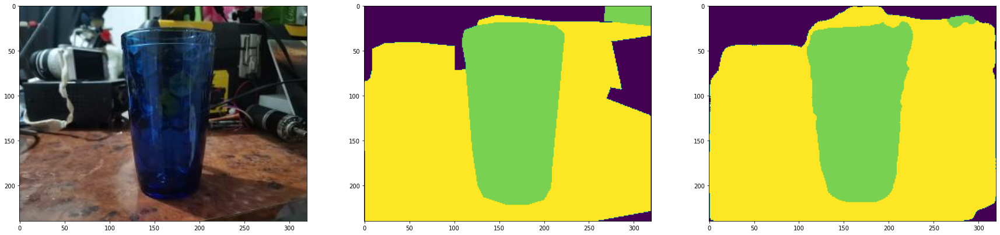

1


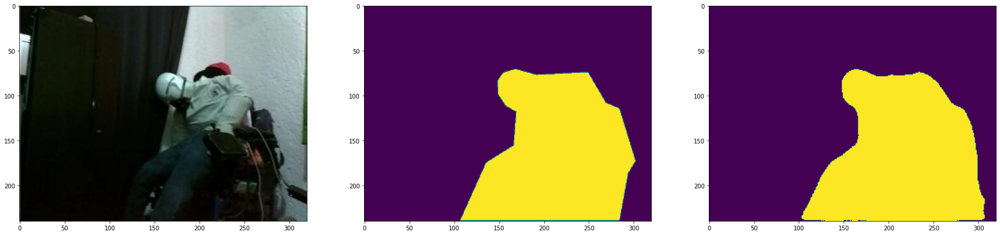

2


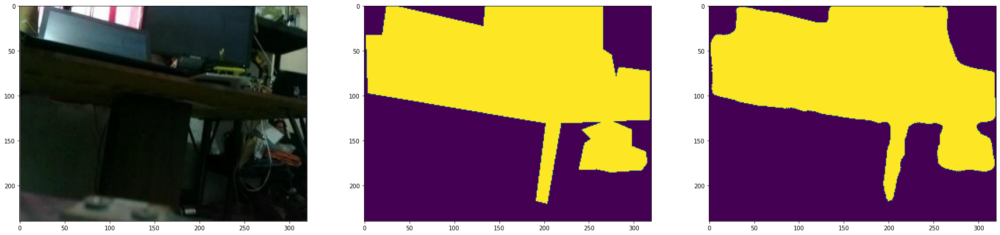

3


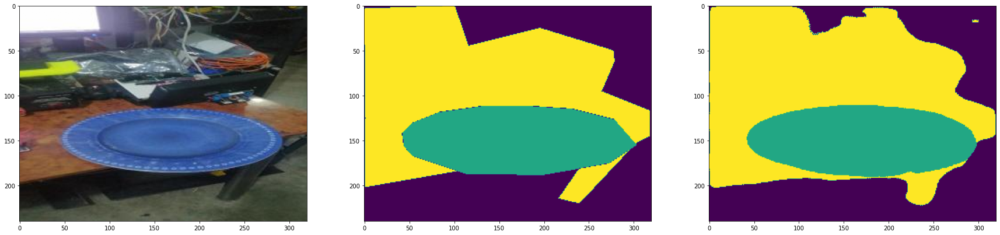

4


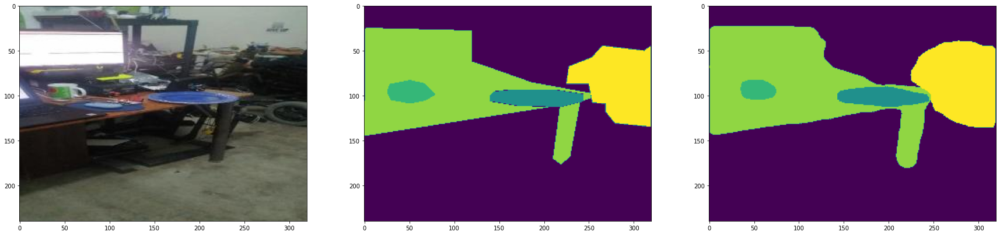

5


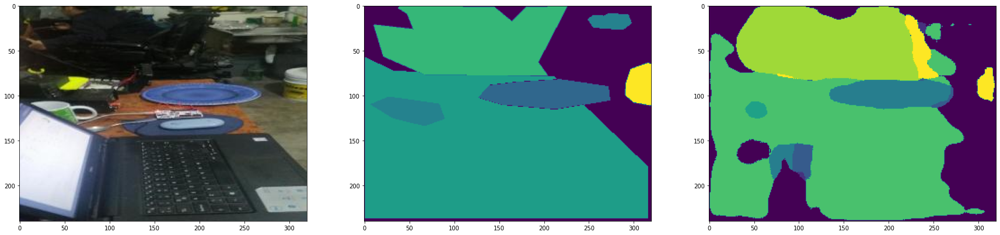

6


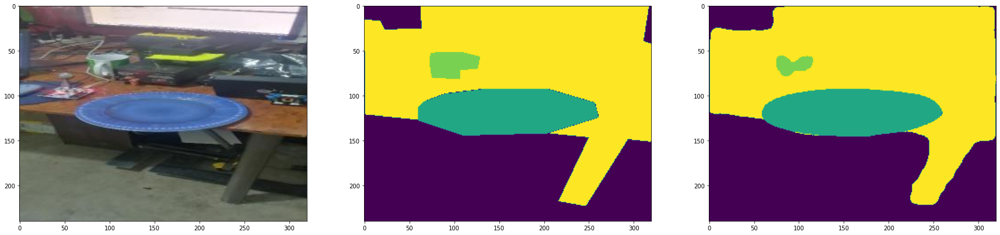

7


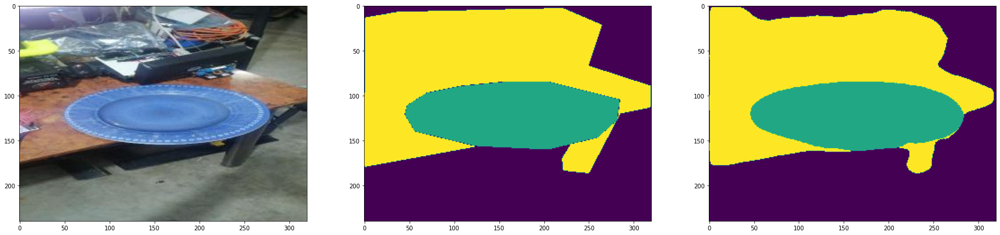

8


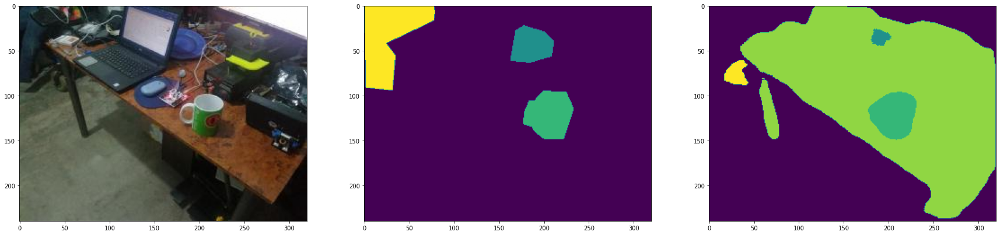

9


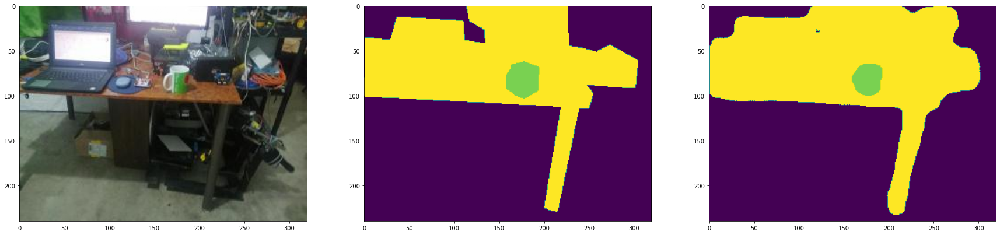

10


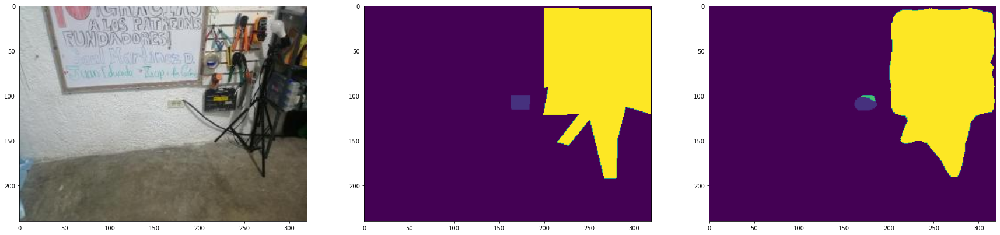

11


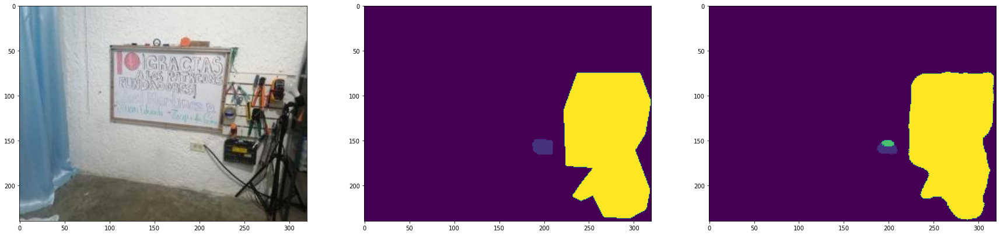

12


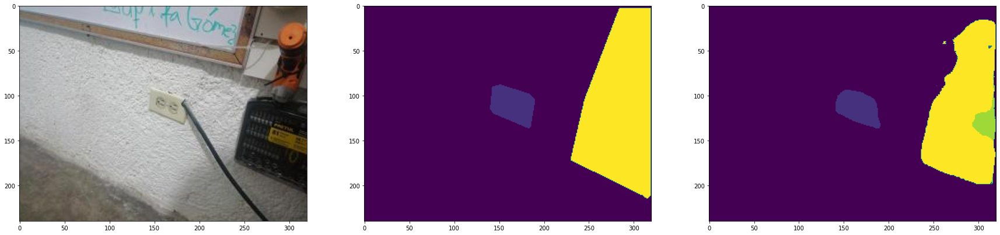

13


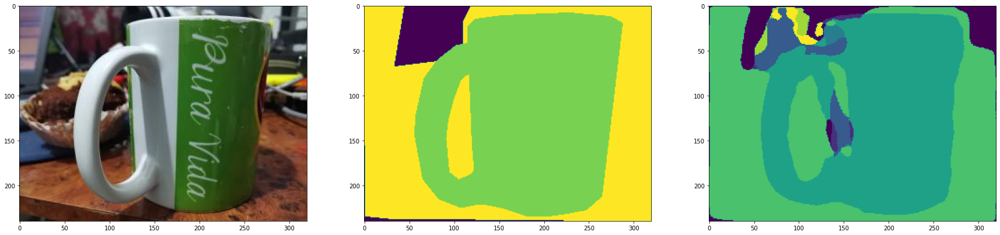

14


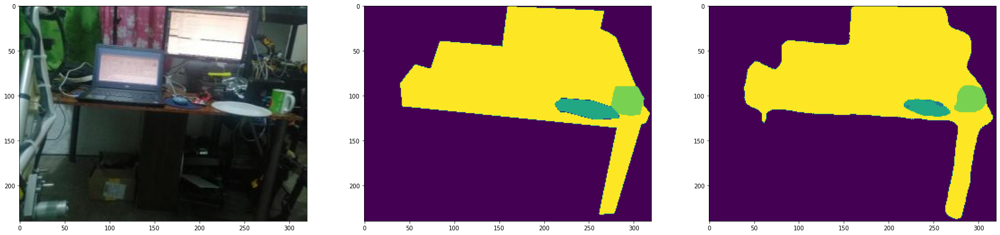

15


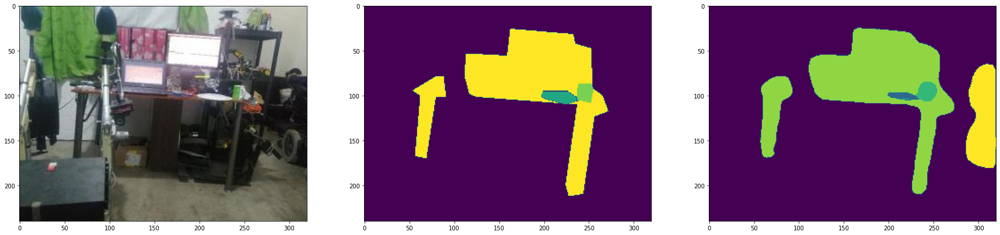

16


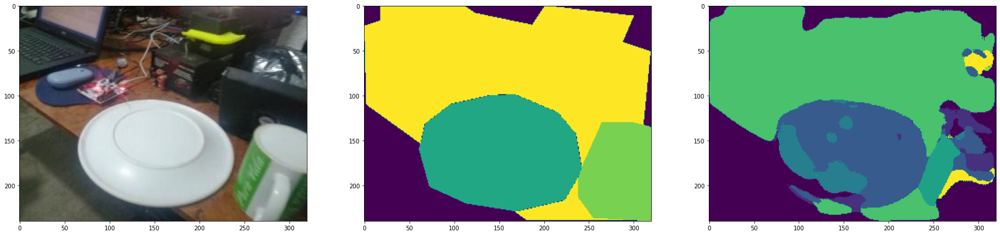

17


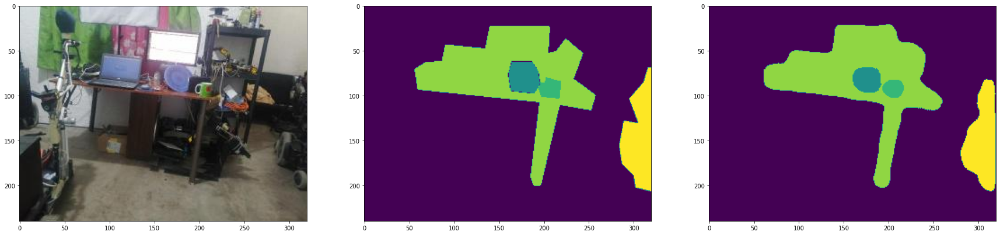

18


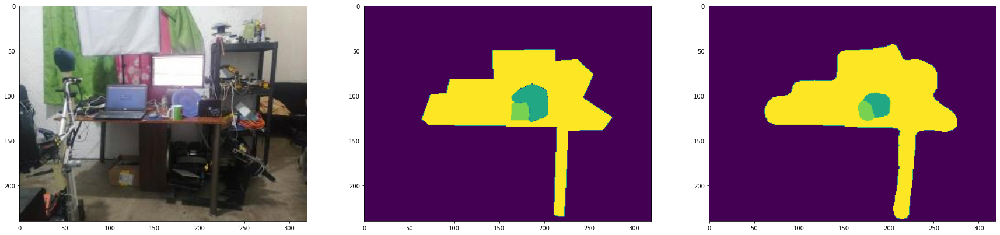

19


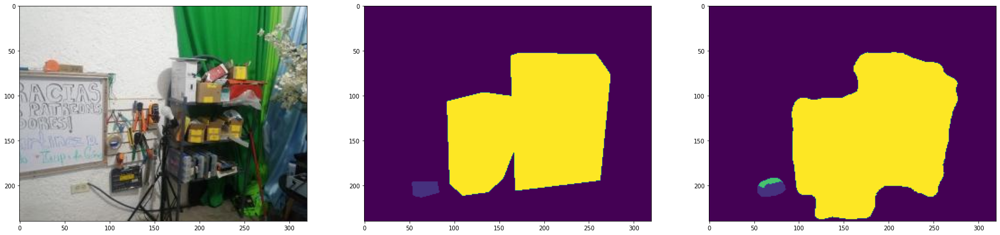

20


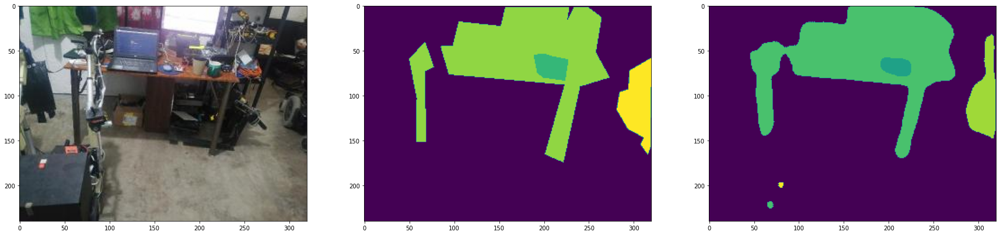

21


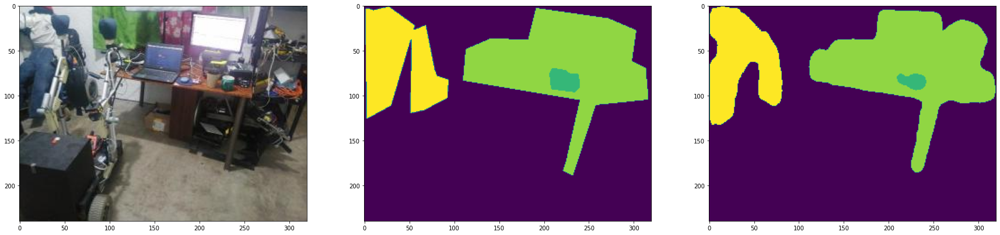

22


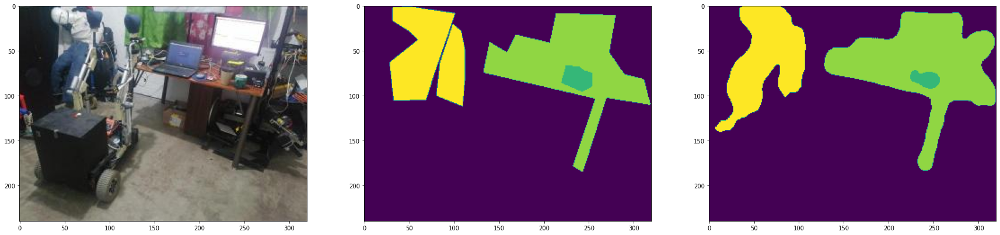

23


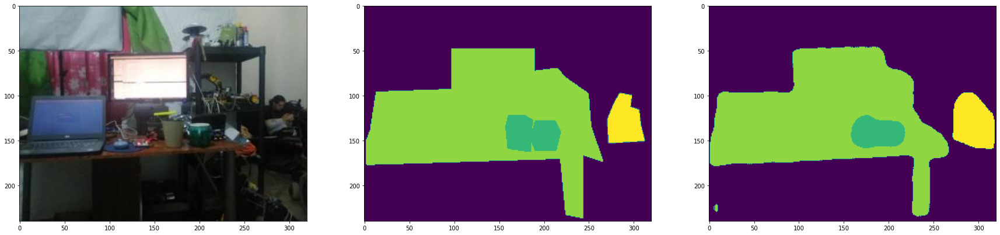

24


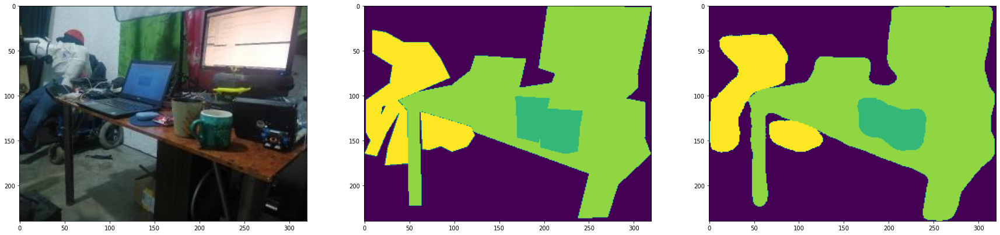

25


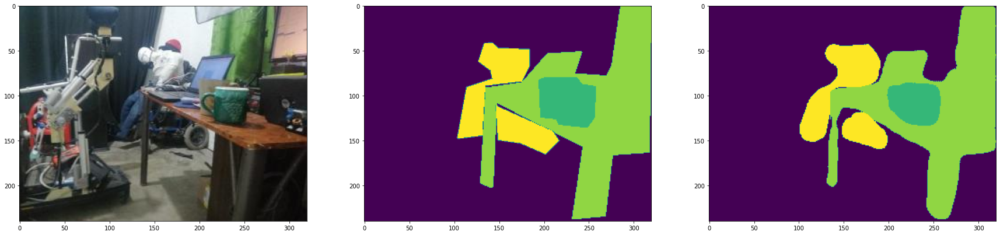

26


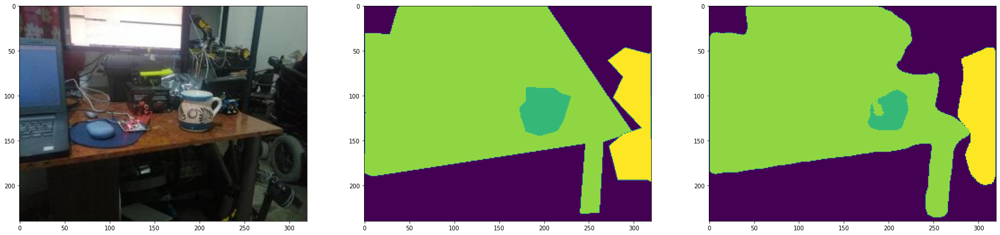

27


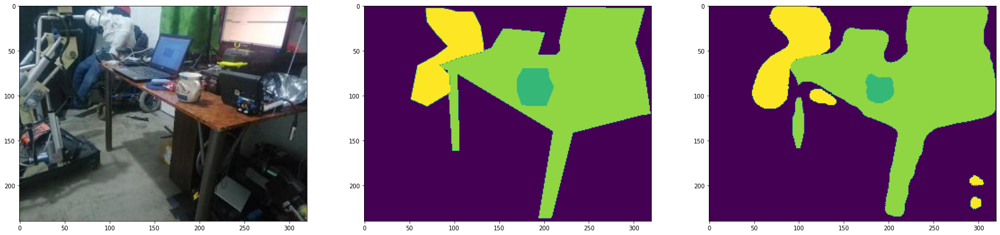

28


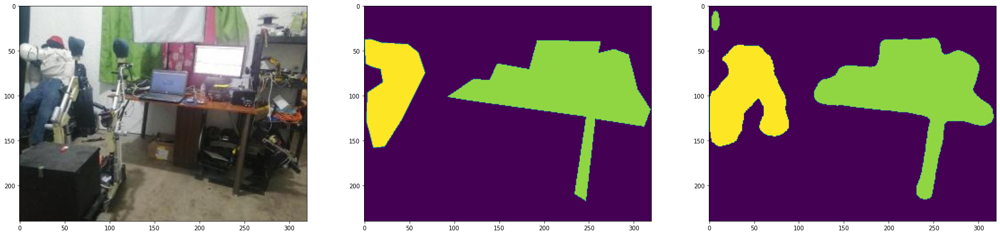

29


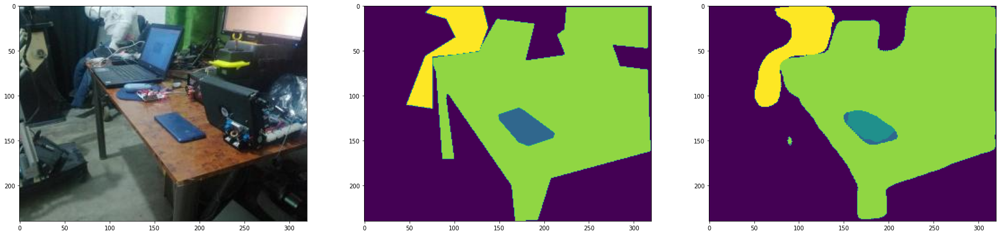

30


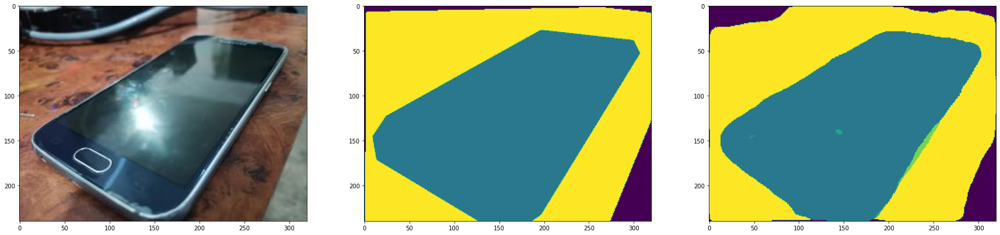

31


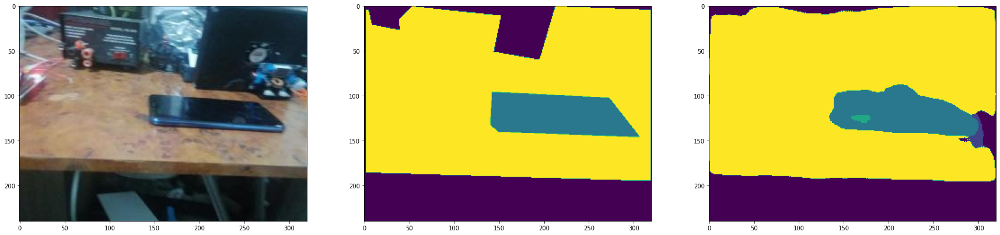

32


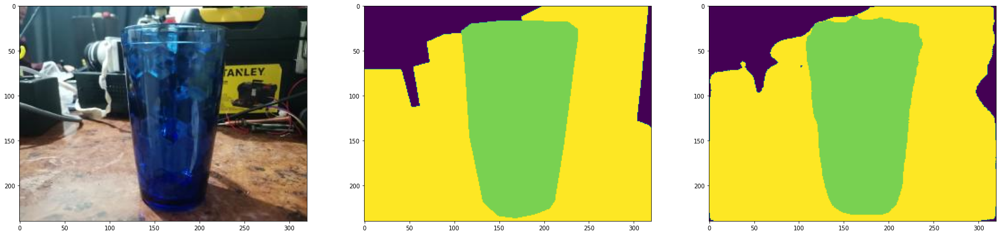

33


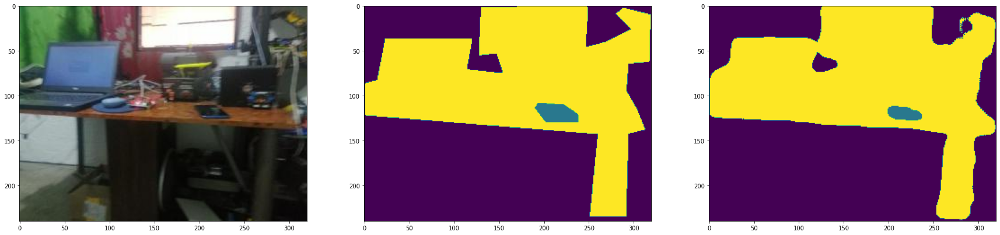

34


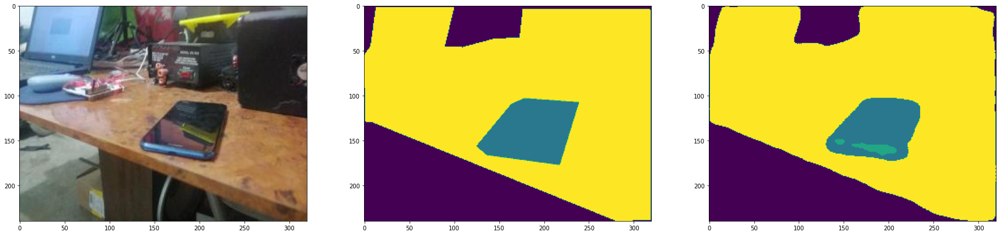

35


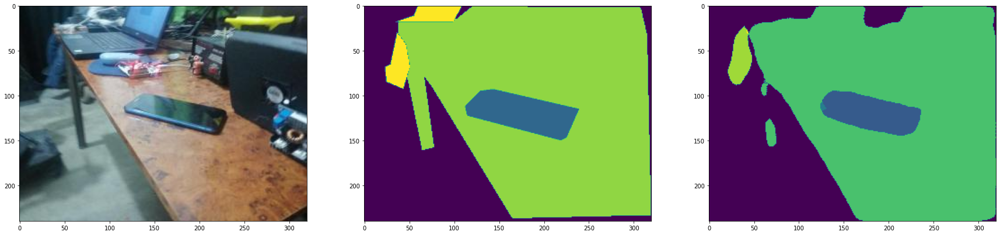

36


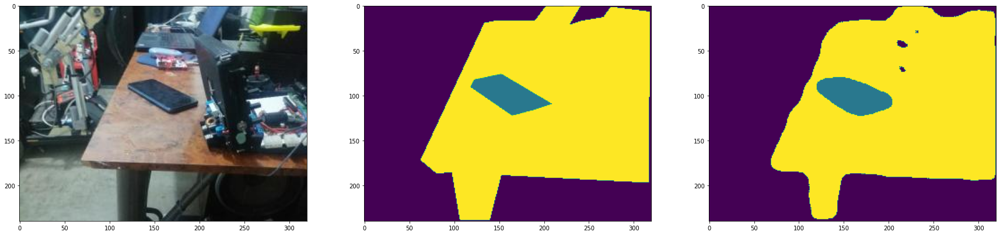

37


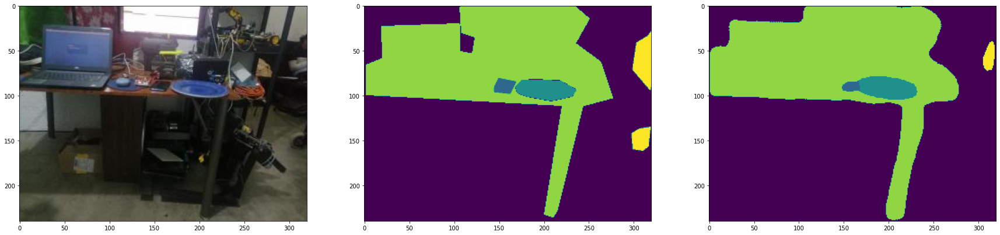

38


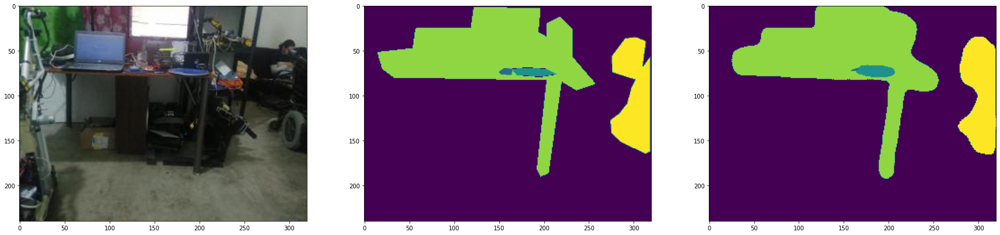

39


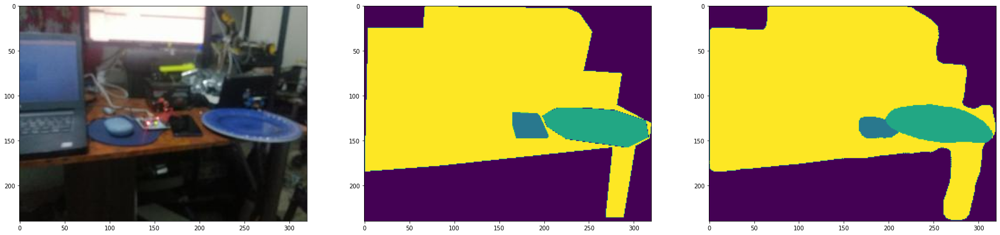

40


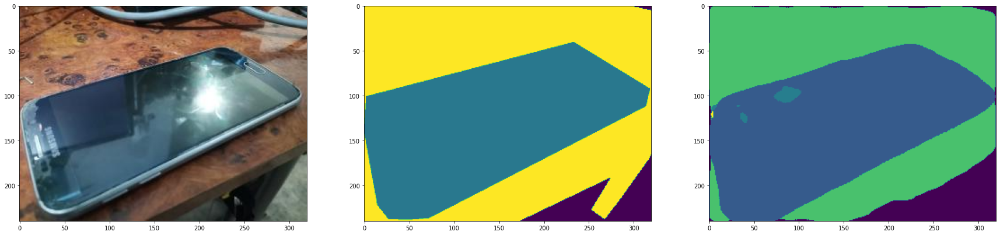

41


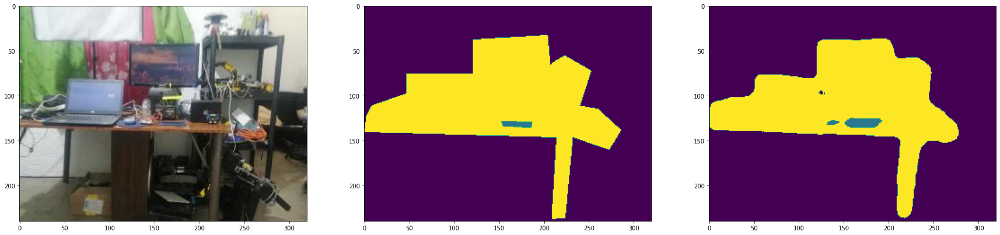

42


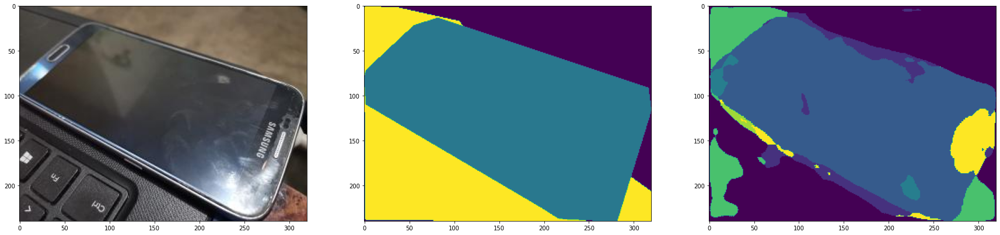

43


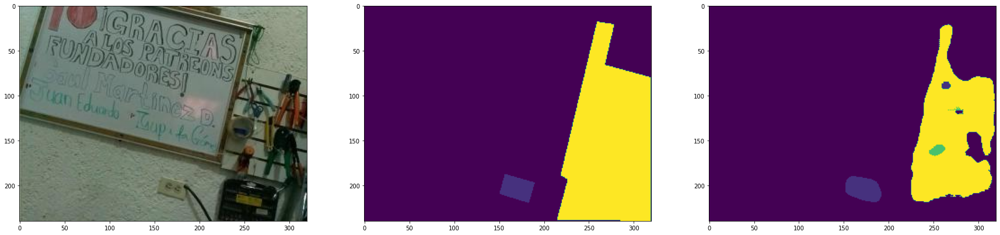

44


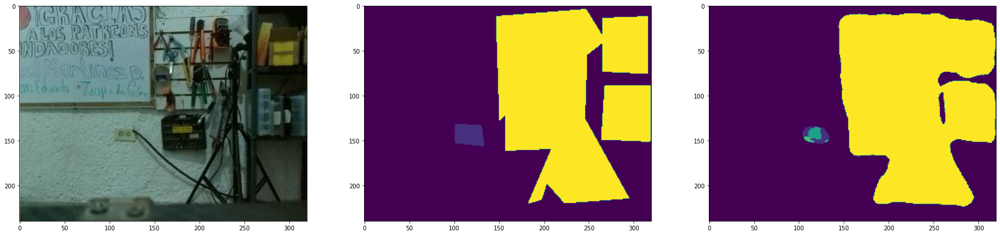

45


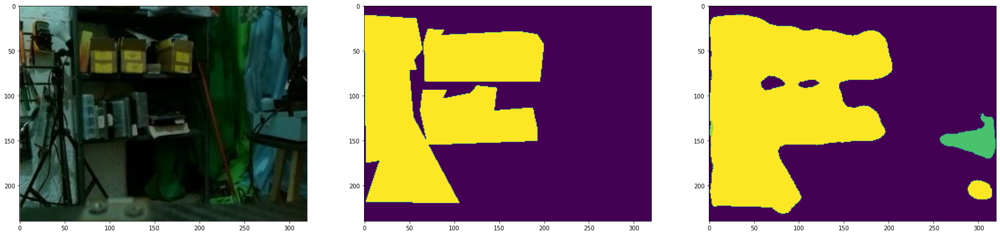

46


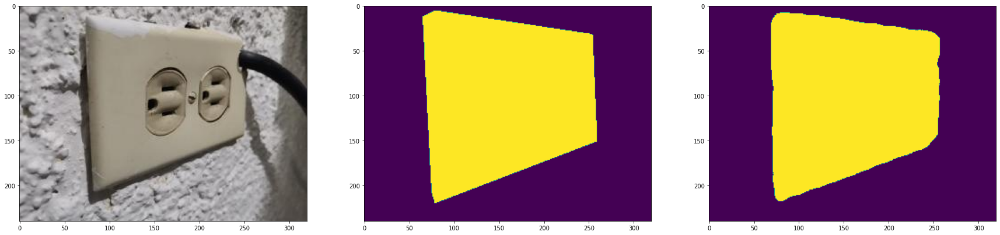

In [16]:
import random
import time
import matplotlib.pyplot as plt
ix= ix+1

model.eval()
for i in range(0,47):
    with torch.no_grad():       
        img, mask = dataset['test'][i]
        output = model(img.unsqueeze(0))[0]
        termino=time.time()
        pred_mask = torch.argmax(output, axis=0)
    print(i)
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,10))
    ax1.imshow(img.squeeze(0).permute(1,2,0))
    ax2.imshow(torch.argmax(mask, axis=0))
    ax3.imshow(pred_mask.squeeze().cpu().numpy())
    plt.show()